# Feature Points Detection and Matching

This notebook demonstrates **feature point detection** and **feature matching** between two images using the SIFT and ORB detectors. The goal is to locate **common objects** (in this case, cars) across the two images by detecting key points, computing descriptors, and matching them.

Two feature detection techniques are implemented:
1. **SIFT (Scale-Invariant Feature Transform)** — detects scale- and rotation-invariant key points and computes 128-dimensional descriptors.
2. **ORB (Oriented FAST and Rotated BRIEF)** — a fast, efficient detector that uses FAST keypoints and BRIEF descriptors with orientation correction.

Both detectors are paired with a **Brute-Force matcher** (with `crossCheck=True` and a distance threshold) to find correspondences between the `BMW.jpeg` and `Dodge.avif` images.

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

## Load the images

Read `BMW.jpeg` and `Dodge.avif` and convert to grayscale for feature detection. OpenCV loads images in BGR format by default, so we convert to RGB for correct display with Matplotlib.

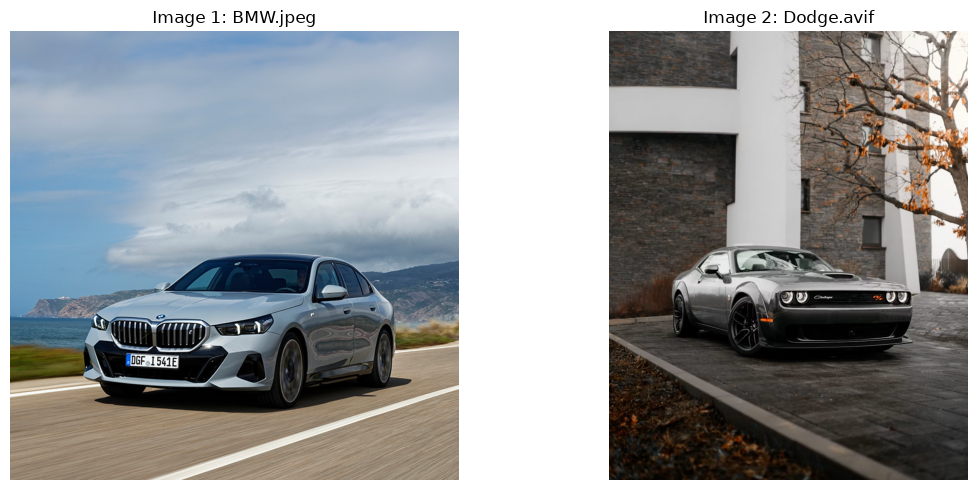

In [2]:
bmw_path = 'BMW.jpeg'
dodge_path = 'Dodge.avif'

img1_bgr = cv2.imread(bmw_path)
img2_bgr = cv2.imread(dodge_path)

if img1_bgr is None:
    raise FileNotFoundError(f'Could not load image: {bmw_path}')
if img2_bgr is None:
    raise FileNotFoundError(f'Could not load image: {dodge_path}')

img1_rgb = cv2.cvtColor(img1_bgr, cv2.COLOR_BGR2RGB)
img2_rgb = cv2.cvtColor(img2_bgr, cv2.COLOR_BGR2RGB)

img1_gray = cv2.cvtColor(img1_bgr, cv2.COLOR_BGR2GRAY)
img2_gray = cv2.cvtColor(img2_bgr, cv2.COLOR_BGR2GRAY)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(img1_rgb)
axes[0].set_title('Image 1: BMW.jpeg')
axes[0].axis('off')
axes[1].imshow(img2_rgb)
axes[1].set_title('Image 2: Dodge.avif')
axes[1].axis('off')
plt.tight_layout()
plt.show()

## 1. SIFT — Scale-Invariant Feature Transform

SIFT detects key points that are invariant to image scale and rotation. It first identifies potential interest points (extrema in Difference-of-Gaussians across scales), then computes a descriptor for each key point based on local image gradients. Each descriptor is a 128-dimensional vector.

In [3]:
sift = cv2.SIFT_create()

kp1_sift, des1_sift = sift.detectAndCompute(img1_gray, None)
kp2_sift, des2_sift = sift.detectAndCompute(img2_gray, None)

print(f'SIFT — Image 1 (BMW) keypoints: {len(kp1_sift)}')
print(f'SIFT — Image 2 (Dodge) keypoints: {len(kp2_sift)}')

SIFT — Image 1 (BMW) keypoints: 599
SIFT — Image 2 (Dodge) keypoints: 4235


## 2. SIFT Feature Matching

A **Brute-Force matcher** with `crossCheck=True` compares every descriptor in image 1 against every descriptor in image 2 and keeps only **mutual best matches** — pairs where each descriptor is the closest neighbor of the other. This reduces false matches significantly. The resulting matches are then sorted by distance and filtered by a maximum distance threshold to retain only high-confidence correspondences.

SIFT — total matches: 301
SIFT — good matches (dist < 286.5): 118


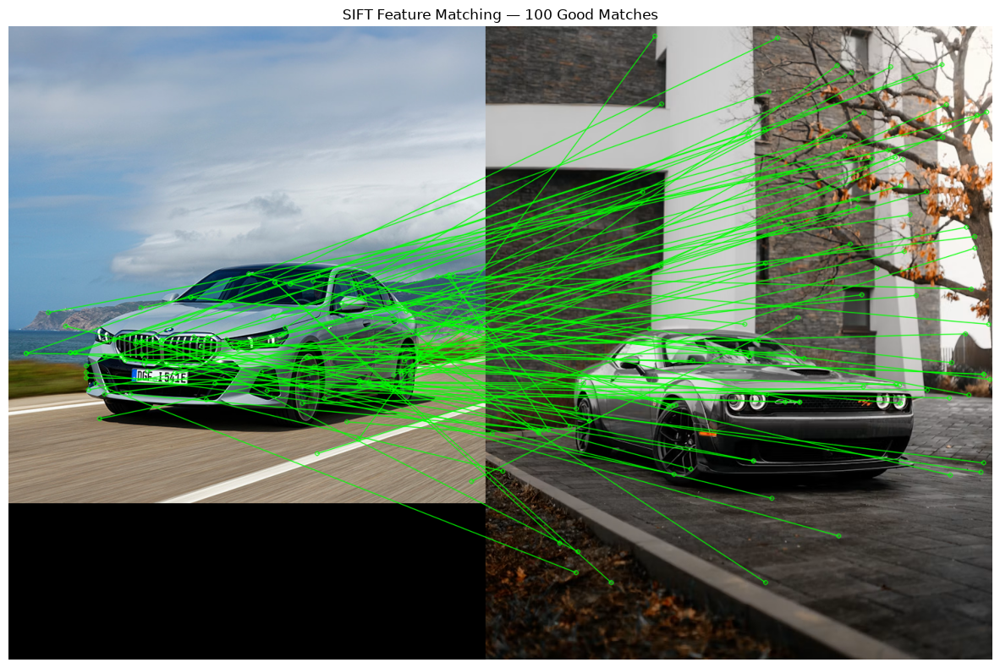

In [4]:
bf_sift = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

matches_sift = bf_sift.match(des1_sift, des2_sift)
matches_sift = sorted(matches_sift, key=lambda x: x.distance)

max_dist = 0.75 * max(m.distance for m in matches_sift)
good_matches_sift = [m for m in matches_sift if m.distance < max_dist]

print(f'SIFT — total matches: {len(matches_sift)}')
print(f'SIFT — good matches (dist < {max_dist:.1f}): {len(good_matches_sift)}')

img_matches_sift = cv2.drawMatches(
    img1_rgb, kp1_sift, img2_rgb, kp2_sift, good_matches_sift[:100],
    None, flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS,
    matchColor=(0, 255, 0), lineThickness=1
)

plt.figure(figsize=(16, 8))
plt.imshow(img_matches_sift)
plt.title(f'SIFT Feature Matching — {len(good_matches_sift[:100])} Good Matches')
plt.axis('off')
plt.show()

## 3. ORB — Oriented FAST and Rotated BRIEF

ORB is a fast, efficient alternative to SIFT. It detects key points using the **FAST** algorithm with **Harris corner response** refinement, assigns each a consistent orientation using the **intensity centroid**, and computes **BRIEF** descriptors (256-bit binary vectors). ORB descriptors are binary, so they use Hamming distance rather than Euclidean distance.

In [5]:
orb = cv2.ORB_create(nfeatures=2000)

kp1_orb, des1_orb = orb.detectAndCompute(img1_gray, None)
kp2_orb, des2_orb = orb.detectAndCompute(img2_gray, None)

print(f'ORB — Image 1 (BMW) keypoints: {len(kp1_orb)}')
print(f'ORB — Image 2 (Dodge) keypoints: {len(kp2_orb)}')

ORB — Image 1 (BMW) keypoints: 2000
ORB — Image 2 (Dodge) keypoints: 2000


## 4. ORB Feature Matching

A **Brute-Force matcher** with `crossCheck=True` and `cv2.NORM_HAMMING` compares the binary ORB descriptors between the two images. Hamming distance counts the number of differing bits between two binary vectors, which is the natural metric for binary descriptors.

ORB — total matches: 499
ORB — good matches (dist < 57.8): 250


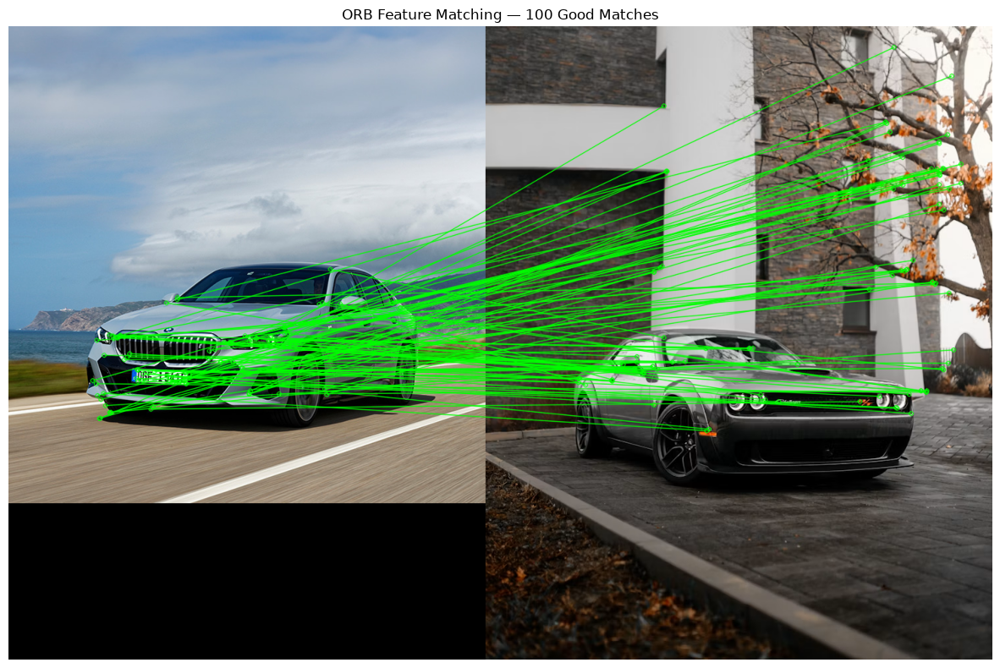

In [6]:
bf_orb = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

matches_orb = bf_orb.match(des1_orb, des2_orb)
matches_orb = sorted(matches_orb, key=lambda x: x.distance)

max_dist_orb = 0.75 * max(m.distance for m in matches_orb)
good_matches_orb = [m for m in matches_orb if m.distance < max_dist_orb]

print(f'ORB — total matches: {len(matches_orb)}')
print(f'ORB — good matches (dist < {max_dist_orb:.1f}): {len(good_matches_orb)}')

img_matches_orb = cv2.drawMatches(
    img1_rgb, kp1_orb, img2_rgb, kp2_orb, good_matches_orb[:100],
    None, flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS,
    matchColor=(0, 255, 0), lineThickness=1
)

plt.figure(figsize=(16, 8))
plt.imshow(img_matches_orb)
plt.title(f'ORB Feature Matching — {len(good_matches_orb[:100])} Good Matches')
plt.axis('off')
plt.show()

## Comparison of SIFT and ORB

The figure below displays the matched features from both detectors side by side for visual comparison.

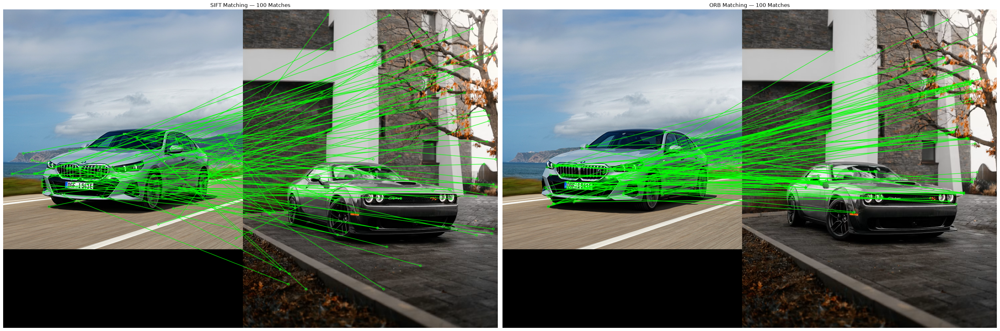

In [7]:
fig, axes = plt.subplots(1, 2, figsize=(32, 14))

axes[0].imshow(img_matches_sift)
axes[0].set_title(f'SIFT Matching — {len(good_matches_sift[:100])} Matches')
axes[0].axis('off')

axes[1].imshow(img_matches_orb)
axes[1].set_title(f'ORB Matching — {len(good_matches_orb[:100])} Matches')
axes[1].axis('off')

plt.tight_layout()
plt.show()

## Keypoint Visualization

The figure below shows the detected keypoints overlaid on the BMW image for both detectors, allowing a visual comparison of the keypoint distributions.

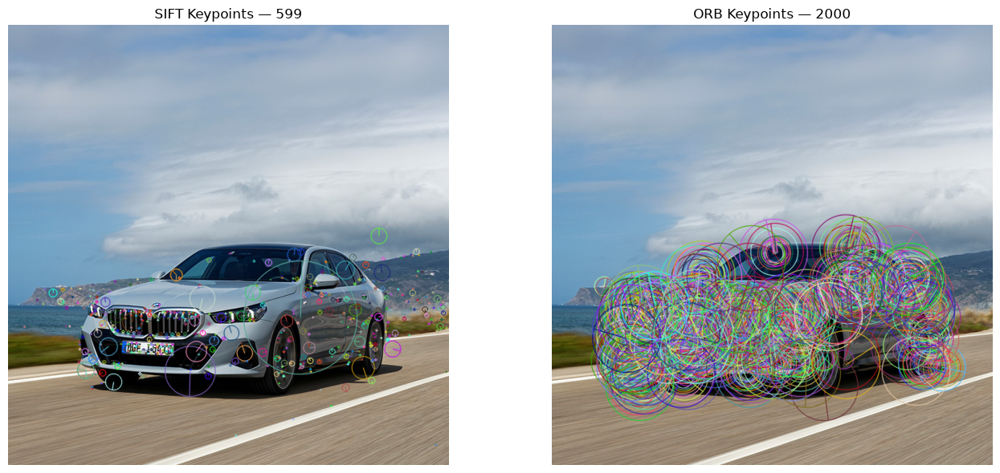

In [8]:
img1_kp_sift = cv2.drawKeypoints(
    img1_rgb, kp1_sift, None,
    flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
)
img1_kp_orb = cv2.drawKeypoints(
    img1_rgb, kp1_orb, None,
    flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
axes[0].imshow(img1_kp_sift)
axes[0].set_title(f'SIFT Keypoints — {len(kp1_sift)}')
axes[0].axis('off')
axes[1].imshow(img1_kp_orb)
axes[1].set_title(f'ORB Keypoints — {len(kp1_orb)}')
axes[1].axis('off')
plt.tight_layout()
plt.show()